# Import Libraries and Install YOLO

In [ ]:
#References
#https://github.com/roboflow/notebooks/blob/main/notebooks/train-yolov8-object-detection-on-custom-dataset.ipynb
#https://blog.roboflow.com/how-to-train-yolov8-on-a-custom-dataset/
#https://docs.ultralytics.com/modes/train/
#https://github.com/ultralytics/ultralytics?tab=readme-ov-file
#https://docs.ultralytics.com/tasks/detect/
#https://learnopencv.com/train-yolov8-on-custom-dataset/

#Dataset
#https://www.kaggle.com/datasets/pkdarabi/cardetection/data

In [66]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
import locale
import yaml

locale.getpreferredencoding = lambda: "UTF-8"
HOME = os.getcwd()
print(HOME)

from ultralytics import YOLO
from IPython import display
from IPython.display import display, Image
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.23 🚀 Python-3.12.2 torch-2.3.0 CPU (Apple M1 Pro)
Setup complete ✅ (10 CPUs, 16.0 GB RAM, 453.4/460.4 GB disk)


# Connect to Google Drive and Install packages for Google Colab

In [1]:
#Used when connecting to Google Drive
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [4]:
#Install on Google Colab 
!pip install ultralytics==8.0.196

from IPython import display
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 30.2/201.2 GB disk)


# Load the YAML File

In [63]:
data_yaml = "TrafficSign_Dataset/data.yaml"

# Get the number of classes from the yaml file
with open(data_yaml, 'r') as f:
    data = yaml.load(f, Loader=yaml.FullLoader)
    print(data)
    num_classes = data['nc']
    name = data['names']
    
print("The total number of classes in the dataset is: ", num_classes)
print ("The classes are: ", name)

{'train': '../train/images', 'val': '../valid/images', 'test': '../test/images', 'nc': 15, 'names': ['Green Light', 'Red Light', 'Speed Limit 10', 'Speed Limit 100', 'Speed Limit 110', 'Speed Limit 120', 'Speed Limit 20', 'Speed Limit 30', 'Speed Limit 40', 'Speed Limit 50', 'Speed Limit 60', 'Speed Limit 70', 'Speed Limit 80', 'Speed Limit 90', 'Stop'], 'roboflow': {'workspace': 'selfdriving-car-qtywx', 'project': 'self-driving-cars-lfjou', 'version': 6, 'license': 'CC BY 4.0', 'url': 'https://universe.roboflow.com/selfdriving-car-qtywx/self-driving-cars-lfjou/dataset/6'}}
The total number of classes in the dataset is:  15
The classes are:  ['Green Light', 'Red Light', 'Speed Limit 10', 'Speed Limit 100', 'Speed Limit 110', 'Speed Limit 120', 'Speed Limit 20', 'Speed Limit 30', 'Speed Limit 40', 'Speed Limit 50', 'Speed Limit 60', 'Speed Limit 70', 'Speed Limit 80', 'Speed Limit 90', 'Stop']


# Visualize the dataset

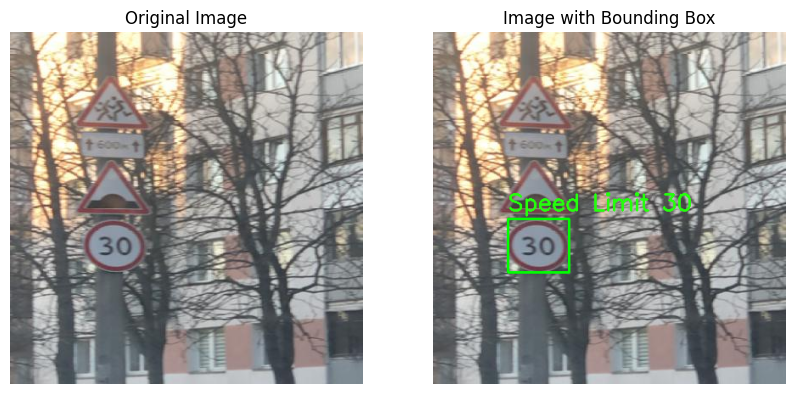

In [65]:
#Image path
train_image = 'TrafficSign_Dataset/train/images/road296_png.rf.1e0af014067e97a7f7a589f98d8587e3.jpg'
train_image_label = 'TrafficSign_Dataset/train/labels/road296_png.rf.1e0af014067e97a7f7a589f98d8587e3.txt'

#plot two images side by side the first one the original image and the second one the image with the bounding box and the label
def plot_images(image, label):
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    image = cv2.imread(image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    ax[0].imshow(image)
    ax[0].axis('off')
    ax[0].set_title('Original Image')

    with open(label, 'r') as f:
        for line in f:
            data = line.split()
            x = float(data[1])
            y = float(data[2])
            w = float(data[3])
            h = float(data[4])
            x1 = int((x - w / 2) * image.shape[1])
            y1 = int((y - h / 2) * image.shape[0])
            x2 = int((x + w / 2) * image.shape[1])
            y2 = int((y + h / 2) * image.shape[0])
            cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
            #print(name)
            #print(data[0])
            #print(name[int(data[0])])
            cv2.putText(image, name[int(data[0])], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (36,255,12), 2)
    ax[1].imshow(image)
    ax[1].axis('off')
    ax[1].set_title('Image with Bounding Box')
    plt.show()

plot_images(train_image, train_image_label)

# Train/Validation/Test Split

In [61]:
#Count the total images in the train, validation and test dataset
train_images = 'TrafficSign_Dataset/train/images'
valid_images = 'TrafficSign_Dataset/valid/images'
test_images = 'TrafficSign_Dataset/test/images'

train_images_list = os.listdir(train_images)
valid_images_list = os.listdir(valid_images)
test_images_list = os.listdir(test_images)

print("The total number of images in the train dataset is: ", len(train_images_list))
print("The total number of images in the validation dataset is: ", len(valid_images_list))
print("The total number of images in the test dataset is: ", len(test_images_list))

The total number of images in the train dataset is:  3530
The total number of images in the validation dataset is:  801
The total number of images in the test dataset is:  638


# YOLOv8 Model Architecture

In [77]:
#Load the YOLOv8 model
model = YOLO(model='yolov8s')

#Print the model architecture
print(model)

YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(96, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_s

# Training 
### DO NOT RUN THE CELLS BELOW OR IT WILL TRAIN THE MODEL AGAIN!

In [3]:
#Dataset path
dataset_path = '/content/drive/MyDrive/TrafficSign_Dataset'

#Copy the dataset to the local machine
!cp -r /content/drive/MyDrive/TrafficSign_Dataset /content

In [6]:
#Example from the YOLOv8 notebook 
#!yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source='https://media.roboflow.com/notebooks/examples/dog.jpeg' save=True

100% 6.23M/6.23M [00:00<00:00, 68.1MB/s]
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs

100% 104k/104k [00:00<00:00, 18.5MB/s]
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/dog.jpeg: 640x384 1 person, 1 car, 1 dog, 455.0ms
Speed: 16.4ms preprocess, 455.0ms inference, 2302.9ms postprocess per image at shape (1, 3, 640, 384)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [10]:
data_yaml = 'TrafficSign_Dataset/data.yaml'
!cat {data_yaml}

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 15
names: ['Green Light', 'Red Light', 'Speed Limit 10', 'Speed Limit 100', 'Speed Limit 110', 'Speed Limit 120', 'Speed Limit 20', 'Speed Limit 30', 'Speed Limit 40', 'Speed Limit 50', 'Speed Limit 60', 'Speed Limit 70', 'Speed Limit 80', 'Speed Limit 90', 'Stop']

roboflow:
  workspace: selfdriving-car-qtywx
  project: self-driving-cars-lfjou
  version: 6
  license: CC BY 4.0
  url: https://universe.roboflow.com/selfdriving-car-qtywx/self-driving-cars-lfjou/dataset/6

In [14]:
image_size = 640

model.train(
    data='/content/TrafficSign_Dataset/data.yaml',  # Path to your dataset configuration file
    model = 'yolov8s.pt',  # Initial model
    epochs=100,                   # Initial number of epochs
    imgsz=image_size,             # Image size
    patience=10,                  # Early stopping patience (stop if no improvement for 10 epochs)
    lr0=0.001,                     # Initial learning rate
    plots=True,                    # Plot training and validation metrics

)

New https://pypi.org/project/ultralytics/8.2.24 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/TrafficSign_Dataset/data.yaml, epochs=100, patience=10, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augme

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7fcb716e5b40>
fitness: 0.8447371854105106
keys: ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']
maps: array([    0.52551,     0.50387,     0.83228,     0.90985,     0.90005,     0.91611,     0.86467,     0.92607,     0.88372,      0.8652,     0.87333,     0.91003,     0.86346,      0.7768,     0.93323])
names: {0: 'Green Light', 1: 'Red Light', 2: 'Speed Limit 10', 3: 'Speed Limit 100', 4: 'Speed Limit 110', 5: 'Speed Limit 120', 6: 'Speed Limit 20', 7: 'Speed Limit 30', 8: 'Speed Limit 40', 9: 'Speed Limit 50', 10: 'Speed Limit 60', 11: 'Speed Limit 70', 12: 'Speed Limit 80', 13: 'Speed Limit 90', 14: 'Stop'}
plot: True
results_dict: {'metrics/precision(B)': 0.9511942802978132, 'metrics/re

In [77]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [23]:
model_path = '/content/runs/detect/train2/'

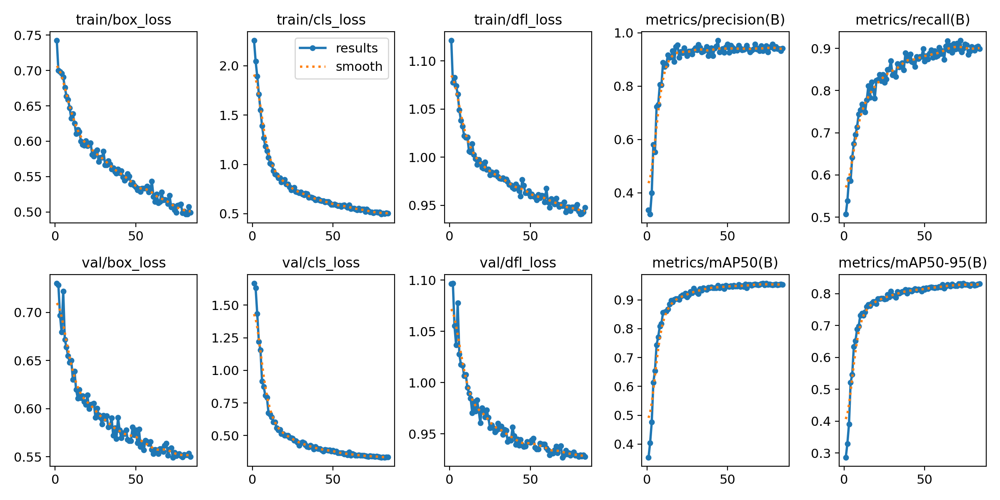

In [24]:
#Print the metric results
Image(filename=model_path + 'results.png', width=1000)

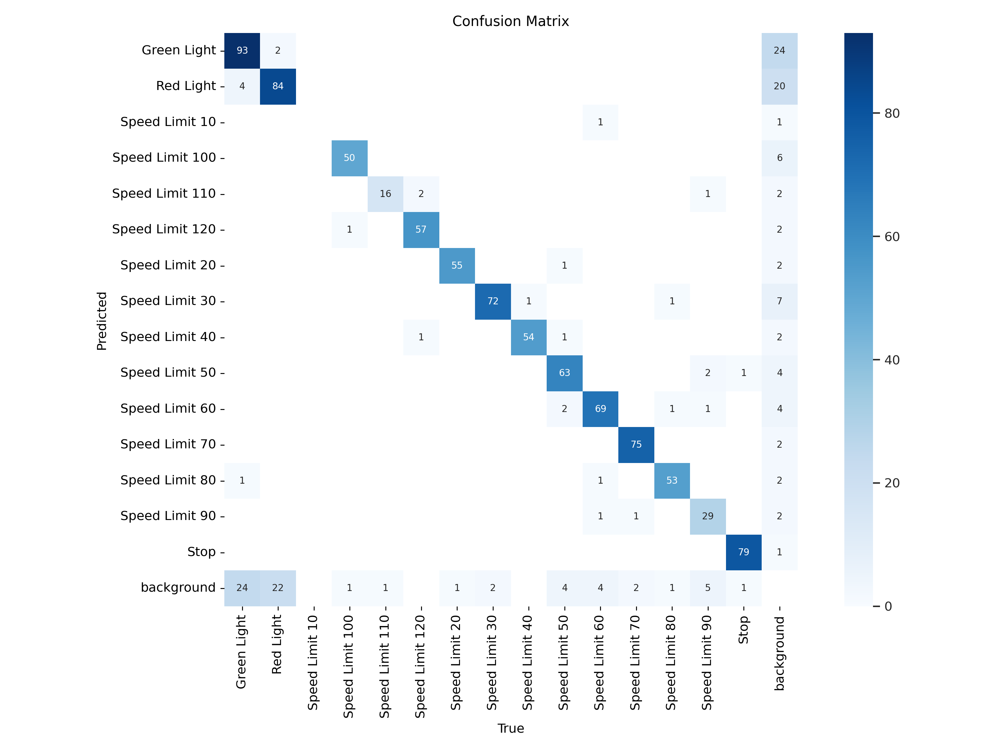

In [79]:
#Print the confusion matrix
Image(filename=model_path + 'confusion_matrix.png', width=1000)

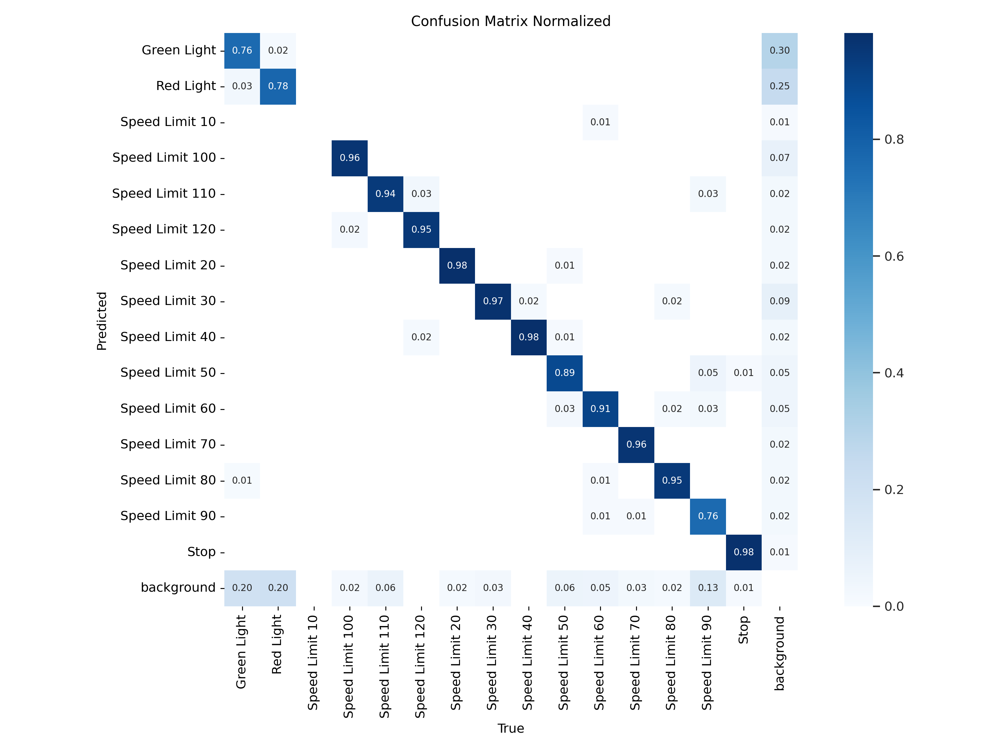

In [44]:
#Print the normalized confusion matrix
Image(filename=model_path + 'confusion_matrix_normalized.png', width=1000)

In [45]:
#save folder to google drive
!cp -r /content/runs /content/drive/MyDrive/TrafficSign_Dataset

# Model Testing

In [107]:
#Testing the model
model_path = '/content/runs/detect/train2/'
model_test = YOLO(model_path + 'weights/best.pt')

#Print the model architecture with best weights
model_test.model

DetectionModel(
  (model): Sequential(
    (0): Conv(
      (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): SiLU(inplace=True)
    )
    (1): Conv(
      (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): SiLU(inplace=True)
    )
    (2): C2f(
      (cv1): Conv(
        (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (cv2): Conv(
        (conv): Conv2d(48, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
    

In [81]:
#print the validation metrics
metrics = model_test.val(split='test')

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3008573 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/TrafficSign_Dataset/test/labels.cache... 638 images, 1 backgrounds, 0 corrupt: 100%|██████████| 638/638 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:11<00:00,  3.64it/s]
                   all        638        770      0.906      0.911      0.949       0.81
           Green Light        638        110      0.885      0.837      0.908      0.516
             Red Light        638         94      0.793      0.733      0.756       0.49
        Speed Limit 10        638          3        

# Inference on a Single Image

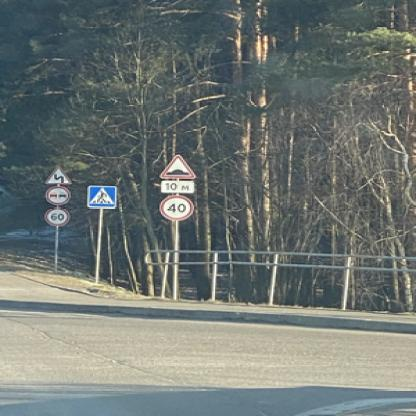

In [90]:
#Load and display a random image from the test dataset
image = "TrafficSign_Dataset/test/images/road654_png.rf.dccac1ff09c216df1ecd3c90e1d3923b.jpg"
Image(image, width=640)

In [91]:
#Inference on the image
!yolo task=detect mode=predict model='runs/detect/train2/weights/best.pt' imgsz=640 conf=0.75 source='TrafficSign_Dataset/test/images/road654_png.rf.dccac1ff09c216df1ecd3c90e1d3923b.jpg' save=True visualize=True

Ultralytics YOLOv8.2.23 🚀 Python-3.12.2 torch-2.3.0 CPU (Apple M1 Pro)
Model summary (fused): 168 layers, 3008573 parameters, 0 gradients, 8.1 GFLOPs

Saving runs/detect/predict9/road654_png.rf.dccac1ff09c216df1ecd3c90e1d3923b/stage0_Conv_features.png... (16/16)
Saving runs/detect/predict9/road654_png.rf.dccac1ff09c216df1ecd3c90e1d3923b/stage1_Conv_features.png... (32/32)
Saving runs/detect/predict9/road654_png.rf.dccac1ff09c216df1ecd3c90e1d3923b/stage2_C2f_features.png... (32/32)
Saving runs/detect/predict9/road654_png.rf.dccac1ff09c216df1ecd3c90e1d3923b/stage3_Conv_features.png... (32/64)
Saving runs/detect/predict9/road654_png.rf.dccac1ff09c216df1ecd3c90e1d3923b/stage4_C2f_features.png... (32/64)
Saving runs/detect/predict9/road654_png.rf.dccac1ff09c216df1ecd3c90e1d3923b/stage5_Conv_features.png... (32/128)
Saving runs/detect/predict9/road654_png.rf.dccac1ff09c216df1ecd3c90e1d3923b/stage6_C2f_features.png... (32/128)
Saving runs/detect/predict9/road654_png.rf.dccac1ff09c216df1ecd3c9

In [94]:
#Save the different stages of the model
stage0 = 'stage0_Conv_features.png'
stage1 = 'stage1_Conv_features.png'
stage2 = 'stage2_C2f_features.png'
stage3 = 'stage3_Conv_features.png'
stage4 = 'stage4_C2f_features.png'
stage5 = 'stage5_Conv_features.png'
stage6 = 'stage6_C2f_features.png'
stage7 = 'stage7_Conv_features.png'
stage8 = 'stage8_C2f_features.png'
stage9 = 'stage9_SPPF_features.png'
stage10 = 'stage10_Upsample_features.png'
stage11 = 'stage11_Concat_features.png'
stage12 = 'stage12_C2f_features.png'
stage13 = 'stage13_Upsample_features.png'
stage14 = 'stage14_Concat_features.png'
stage15 = 'stage15_C2f_features.png'
stage16 = 'stage16_Conv_features.png'
stage17 = 'stage17_Concat_features.png'
stage18 = 'stage18_C2f_features.png'
stage19 = 'stage19_Conv_features.png'
stage20 = 'stage20_Concat_features.png'
stage21 = 'stage21_C2f_features.png'

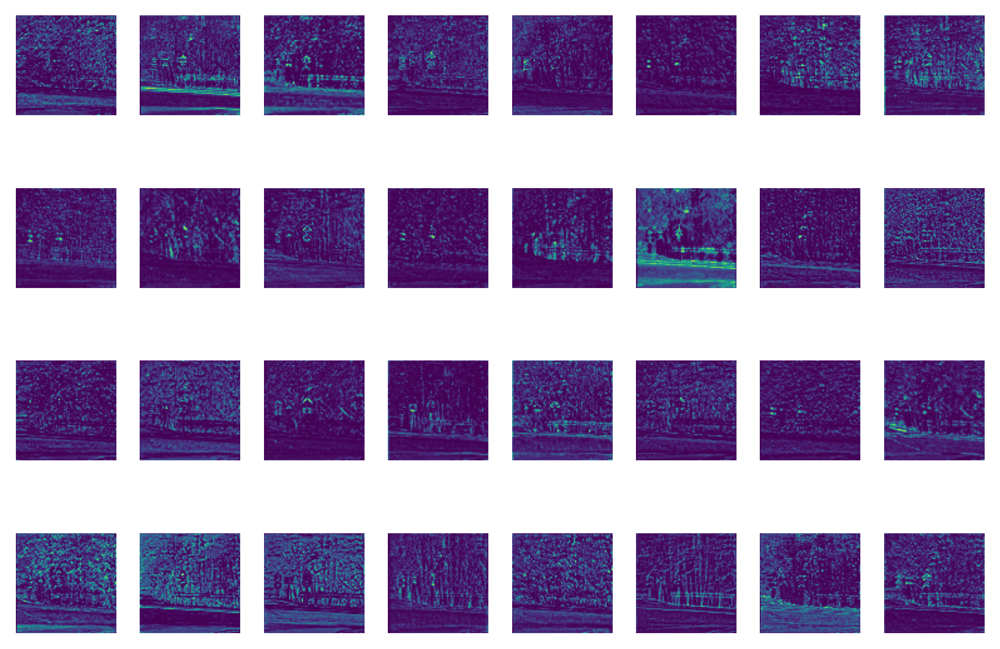

In [96]:
#Path to the prediction folder
prediction = 'runs/detect/predict9/road654_png.rf.dccac1ff09c216df1ecd3c90e1d3923b/'

#Display stage 4 feature maps
Image(filename=prediction + stage4, width=1500)

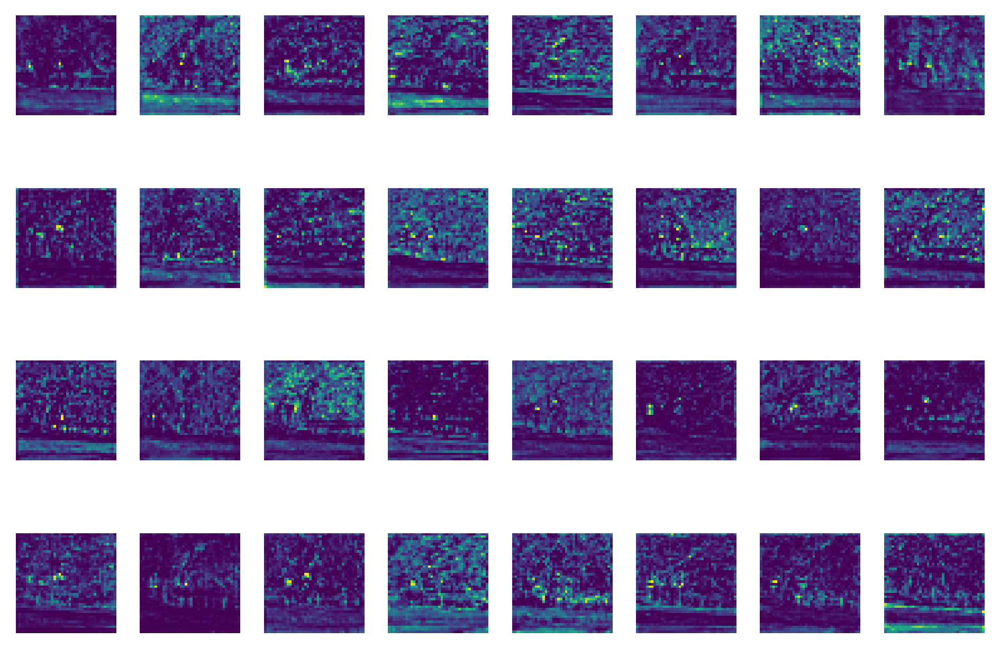

In [97]:
Image(filename=prediction + stage6, width=1500)

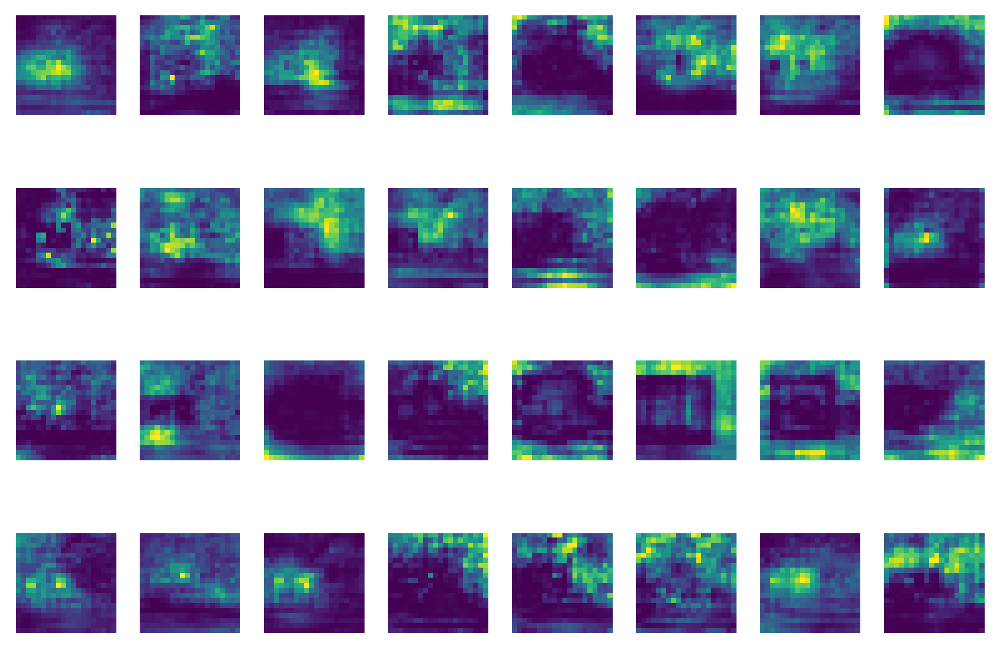

In [98]:
Image(filename=prediction + stage9, width=1500)


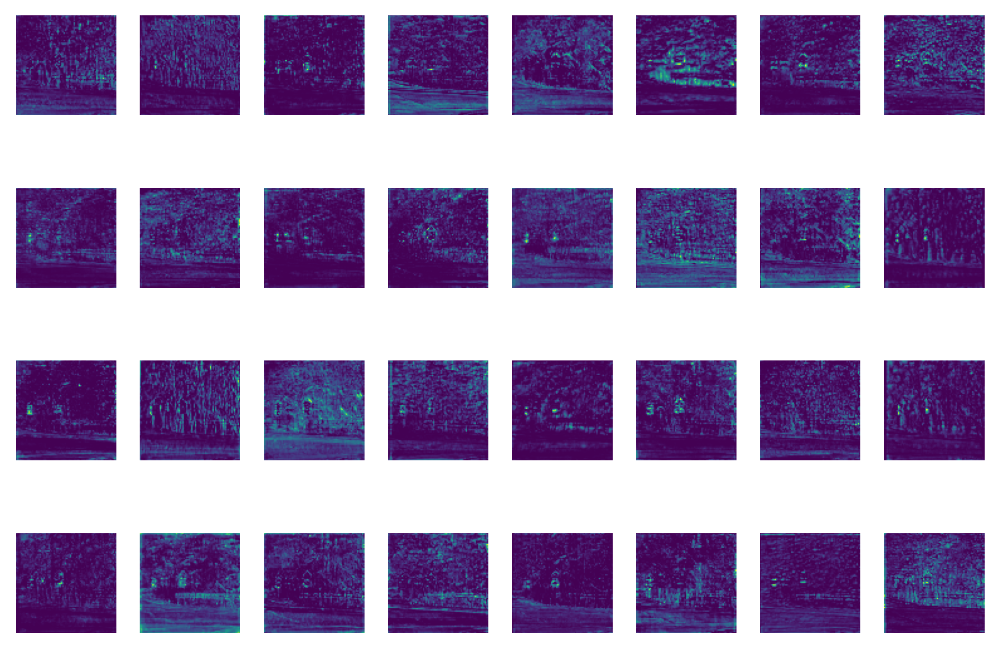

In [99]:
Image(filename=prediction + stage15, width=1500)

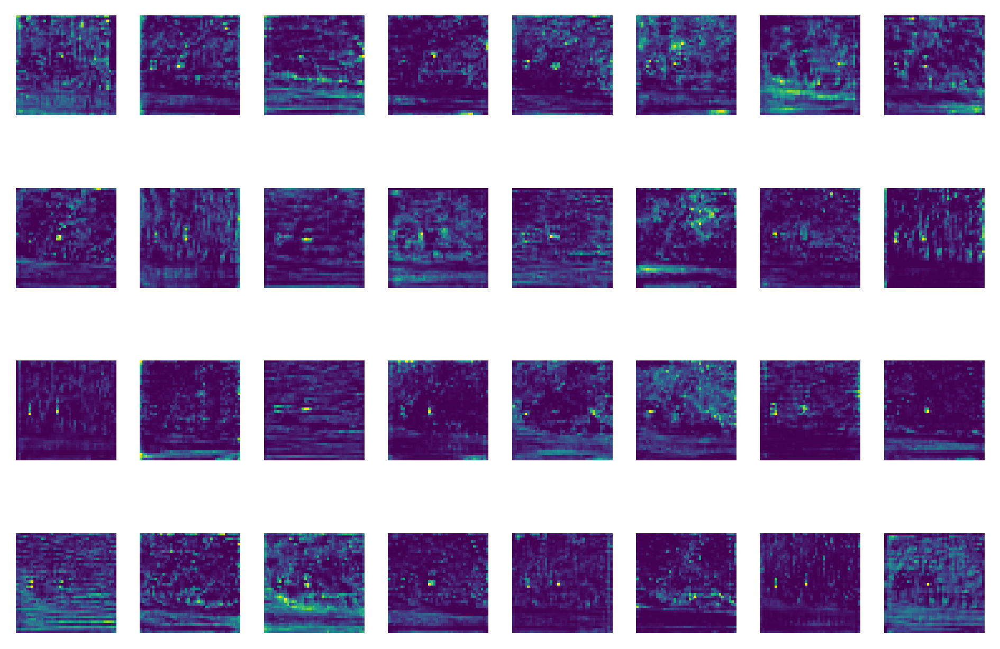

In [100]:
Image(filename=prediction + stage18, width=1500)

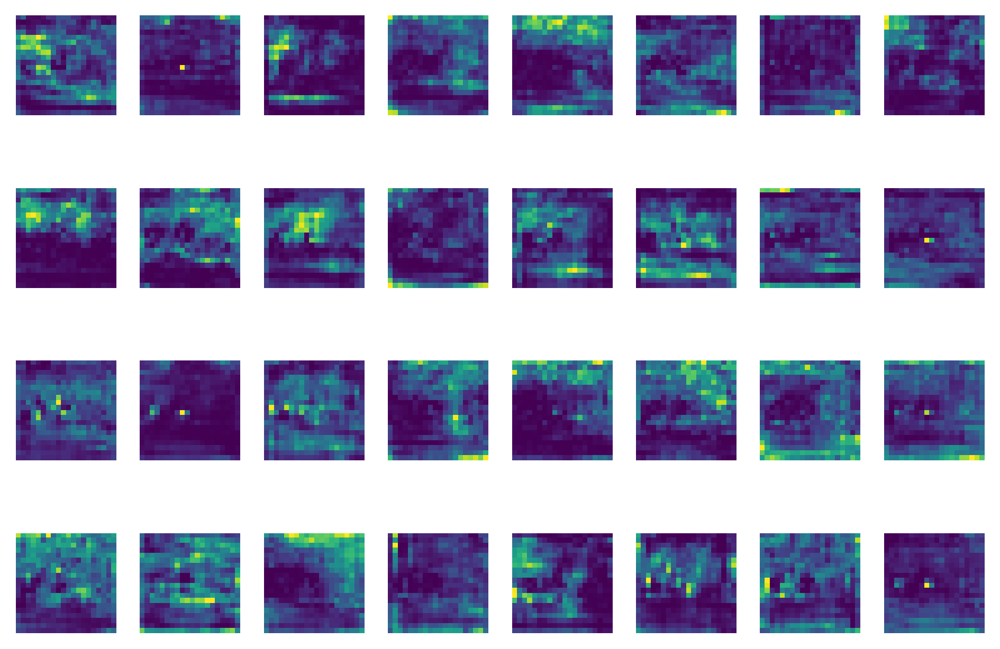

In [101]:
Image(filename=prediction + stage21, width=1500)

In [102]:
#Run the model on the image to get the prediction 
!yolo task=detect mode=predict model='runs/detect/train2/weights/best.pt' imgsz=640 conf=0.75 source='TrafficSign_Dataset/test/images/road654_png.rf.dccac1ff09c216df1ecd3c90e1d3923b.jpg' save=True

Ultralytics YOLOv8.2.23 🚀 Python-3.12.2 torch-2.3.0 CPU (Apple M1 Pro)
Model summary (fused): 168 layers, 3008573 parameters, 0 gradients, 8.1 GFLOPs

image 1/1 /Users/abdulbhutta/Desktop/Directed Studies/Assignment_1/TrafficSign_Dataset/test/images/road654_png.rf.dccac1ff09c216df1ecd3c90e1d3923b.jpg: 640x640 1 Speed Limit 40, 1 Speed Limit 60, 75.1ms
Speed: 2.3ms preprocess, 75.1ms inference, 367.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict10
💡 Learn more at https://docs.ultralytics.com/modes/predict


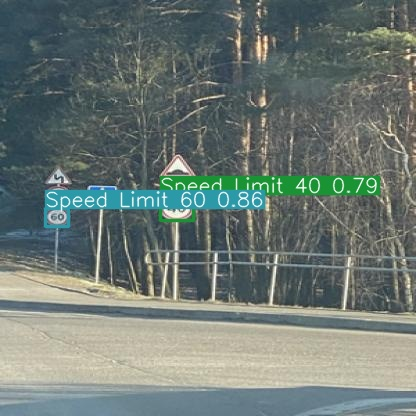

In [104]:
#Display the prediction
Image(filename='/Users/abdulbhutta/Desktop/Directed Studies/Assignment_1/runs/detect/predict10/road654_png.rf.dccac1ff09c216df1ecd3c90e1d3923b.jpg', width=640)